# Анализ рынка заведений общественного питания Москвы

<b>Цель исследования: </b>Исследование рынка общественного питания Москвы для открытия нового заведения.

<b>Описание данных: </b>
 - данные о заведениях общественного питания в г.Москва
 
<b>План исследования: </b>
 1. Изучить общую информацию о данных
 2. Подготовить данные (при необходимости: обработать пропуски, дубликаты, аномалии, привести названия столбцов к единому стилю)
 3. Провести анализ объектов общественного питания (категории заведений, их количество, основные характеристики - территориальные, ценовые)
 4. Провести анализ кофеен. Исследовать конкурентоспособность новой кофейни
 5. Составление итогового вывода
 6. Подготовка презентации

## Оглавление
1. [Изучение общей информации](#info)
2. [Предобработка данных](#preprocessing)<br>
    2.1. [Обработка дубликатов](#preprocessing-duplicates)<br>
    2.2. [Обработка пропущенных значений](#preprocessing-null)<br>
    2.3. [Добавление столбцов](#preprocessing-add_columns)<br>
3. [Анализ данных](#analysis)<br>
    3.1. [Анализ категорий](#categories)<br>
    3.2. [Анализ посадочных мест](#seats)<br>
    3.3. [Анализ  сетевых и несетевых заведений](#chain)<br>
    3.4. [Анализ популярных сетей](#popular)<br>
    3.5. [Анализ районов](#district)<br>
    3.6. [Анализ рейтингов](#rating)<br>
    3.7. [Построение хороплета](#choropleth)<br>
    3.8. [Отображение всех заведений на карте](#all)<br>
    3.9. [Анализ улиц](#street)<br>
    3.10. [Анализ средних чеков](#bill)<br>
    3.11. [Анализ взаимосвязей](#other)<br>
    3.12. [Вывод (анализ данных)](#result_analysis)<br>    
4. [Исследование: открытие кофейни](#cafe)<br>
    4.1. [Особенности расположения кофеен](#cafe_place)<br>
    4.2. [Анализ круглосуточных кофеен](#cafe_24)<br>
    4.3. [Анализ рейтингов кофеен](#cafe_rating)<br>
    4.4. [Анализ среднего чека кофеен](#cafe_price)<br>
    4.5. [Вывод (Исследование: открытие кофейни)](#result_cafe)<br>
5. [Презентация](#presentation)

<a id="info"></a> 
## 1. Изучение общей информации

In [1]:
import pandas as pd
from datetime import datetime, timedelta
from matplotlib import pyplot as plt
import seaborn as sns
from plotly import graph_objects as go
import numpy as np
import math as mth
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
import json

In [2]:
try:
    data = pd.read_csv('/datasets/moscow_places.csv')
except: 
    data = pd.read_csv('moscow_places.csv')

In [3]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


***Вывод***
- В данных представлено всего 8 406 заведений.
- Одна половина столбцов хранит строковый тип данных. Вторая половина - числовой, большая часть - вещественные числа. 
- Столбец 'seats' - количество посадочных мест должно быть целым числом, но так как в данном столбце почти половина - пропуски, перевести в int нет возможности.

<a id="preprocessing"></a> 
## 2. Предобработка данных

<a id="preprocessing-duplicates"></a> 
### 2.1. Обработка дубликатов

In [5]:
data.duplicated().sum()

0

In [6]:
data[['name', 'address']].duplicated().sum()

0

Явных дубликатов не выявлено. 

In [7]:
len(data['name'].unique())

5614

Всего 5 614 уникальных названий из 8 406 общего количества, что говорит о большом количестве сетевых заведений.

In [8]:
# Проверим, везде ли в адресе - г.Москва
list_address = filter(lambda x: x.startswith('Москва'), list(data['address'].unique()))
len(list(list_address)) == len(data['address'].unique())

True

Все адреса начинаются с "Москва". 

In [9]:
data['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

Всего 8 категорий заведений общественного питания.

In [10]:
data['rating'].describe()

count    8406.000000
mean        4.229895
std         0.470348
min         1.000000
25%         4.100000
50%         4.300000
75%         4.400000
max         5.000000
Name: rating, dtype: float64

Диапазон рейтинга заведений находится от 1 до 5. В среднем заведения имеют рейтинг - 4.2 - 4.3

In [11]:
data['price'].unique()

array([nan, 'выше среднего', 'средние', 'высокие', 'низкие'], dtype=object)

In [12]:
len(data['avg_bill'].unique())

898

In [13]:
data['chain'].unique()

array([0, 1], dtype=int64)

In [14]:
data['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [15]:
data['seats'].describe()

count    4795.000000
mean      108.421689
std       122.833396
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

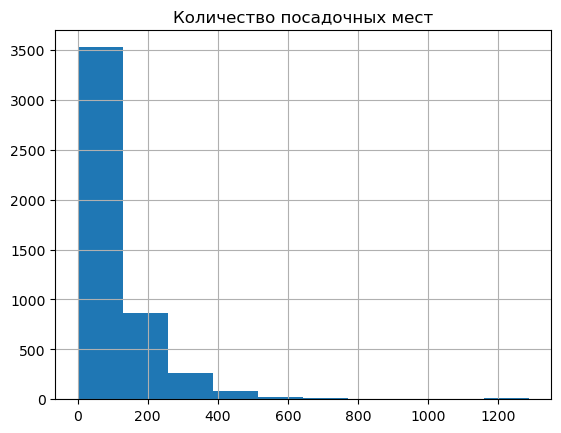

In [16]:
data['seats'].hist()
plt.title('Количество посадочных мест');

Достаточно большой разброс по количеству посадочных мест. Вызывает вопрос максимальное количество посадочных мест более 1000.

<a id="preprocessing-null"></a> 
### 2.2. Обработка пропусков

In [17]:
# Анализ пропусков
total_entries = data.shape[0]
df_null = data.isna().sum()
df_null = df_null[df_null != 0].sort_values(ascending=False)
df_null.name = 'null count'
df_ratio = pd.Series((df_null / total_entries).apply(lambda x: format(x, '.1%')), name="null ratio")
df_total = pd.DataFrame(df_null)
df_total = df_total.join(df_ratio)
df_total

,null count,null ratio
middle_coffee_cup,7871,93.6%
middle_avg_bill,5257,62.5%
price,5091,60.6%
avg_bill,4590,54.6%
seats,3611,43.0%
hours,536,6.4%


Достаточно большой процент пропусков, чтобы можно было удалить данные строки. Также нет возможности заполнить данные медианным или средним значением. 

Можно поставить "заглушку" на пропуски в столбце price. 

In [18]:
data['price'] = data['price'].fillna('нет информации')

<a id="preprocessing-add_columns"></a> 
### 2.3. Добавление столбцов

In [19]:
# Добавление столбца street с названием улицы
def show_street(address):
    return address.split(', ')[1]

data['street'] = data['address'].agg(show_street)

data['street']

0                 улица Дыбенко
1                 улица Дыбенко
2            Клязьминская улица
3       улица Маршала Федоренко
4           Правобережная улица
                 ...           
8401          Профсоюзная улица
8402      Пролетарский проспект
8403           Люблинская улица
8404           Люблинская улица
8405        Россошанский проезд
Name: street, Length: 8406, dtype: object

In [20]:
# Добавление столбца is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно
data['is_24/7'] = data['hours'] == 'ежедневно, круглосуточно'

***Вывод***
- При работе с данными дубликатов не выявлено. 
- Нет возможности заполнить пропуски по основной массе столбцов. 
- Пропуски в столбце price заменены на 'нет информации'.
- Добавлены столбцы 'street', 'is_24/7'.

<a id="analysis"></a> 
## 3. Анализ данных

<a id="categories"></a> 
### 3.1. Анализ категорий
***Какие категории заведений представлены в данных? Исследуйте количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Ответьте на вопрос о распределении заведений по категориям.***

In [21]:
sns.set_palette("Spectral")
sns.set_style('dark')

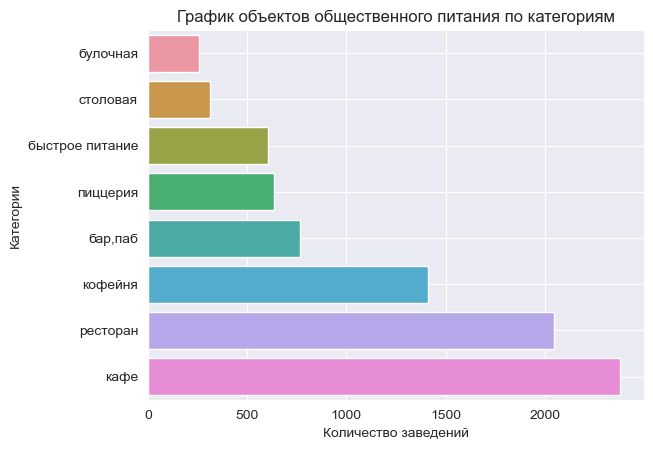

In [22]:
# группируем данные по категориям
data_categories = data.groupby('category')['category'].count().sort_values()

ax = sns.barplot(x = data_categories, y = data_categories.index)
plt.title('График объектов общественного питания по категориям')
plt.xlabel('Количество заведений')
plt.ylabel('Категории')
plt.grid()

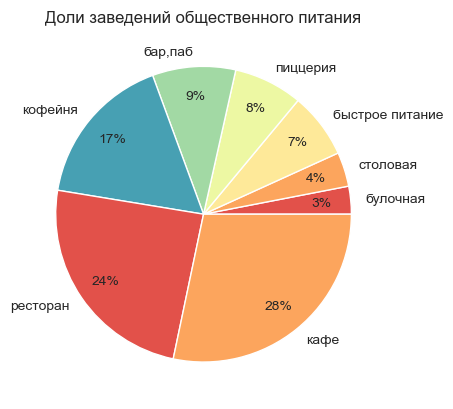

In [23]:
data_categories.plot(kind='pie', title='Доли заведений общественного питания', autopct='%1.0f%%', pctdistance=0.8).set_ylabel("");

- Всего в данных представлено 8 категорий заведений.
- Наибольшая доля у заведений категории "кафе" - 28%, на втором месте - "рестораны" - 24%.
- Доля кофеен составляет 17%.
- Меньше всего представлено столовых и булочных (4% и 3% соответственно).

<a id="seats"></a> 
### 3.2. Анализ посадочных мест
***Исследуйте количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Проанализируйте результаты и сделайте выводы.***

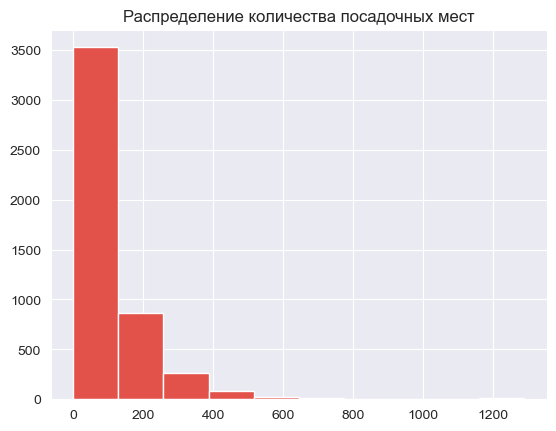

In [24]:
data['seats'].hist()
plt.title('Распределение количества посадочных мест');

Так как распределение не нормальное и досточно длинный хвост - для анализа по категориям возьмем медианные значения.

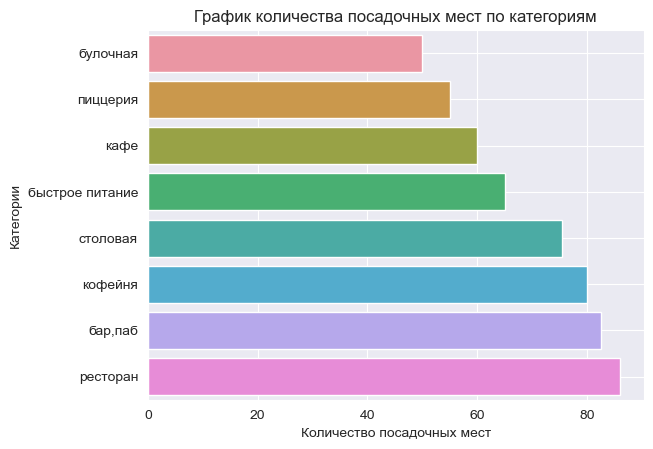

In [25]:
data_seats = data.groupby('category')['seats'].median().sort_values()
ax = sns.barplot(x = data_seats, y = data_seats.index)
plt.title('График количества посадочных мест по категориям')
plt.xlabel('Количество посадочных мест')
plt.ylabel('Категории')
plt.grid()

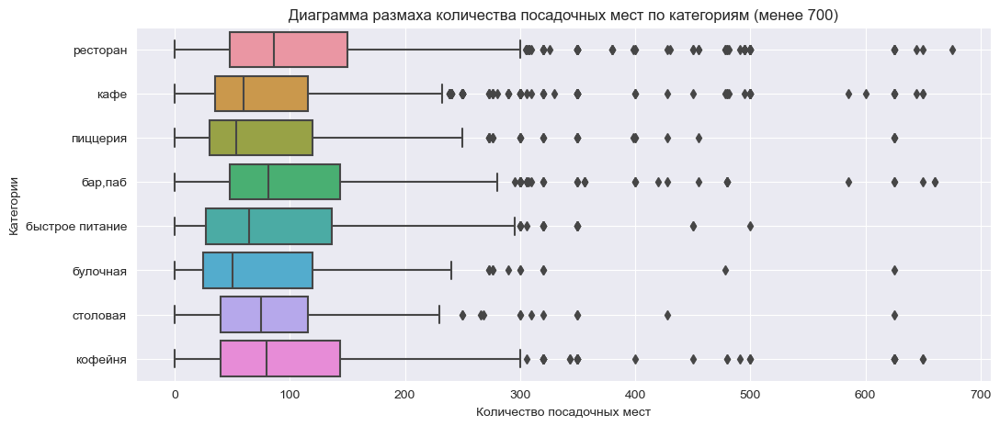

In [26]:
plt.figure(figsize=(12, 5))
ax = sns.boxplot(x = data.query('seats < 700')['seats'], y = data.query('seats < 700')['category'])
plt.title('Диаграмма размаха количества посадочных мест по категориям (менее 700)')
plt.xlabel('Количество посадочных мест')
plt.ylabel('Категории')
plt.grid()

- Наибольшее количество посадочных мест у ресторанов, затем идут бары и кофейни. В среднем в данных заведениях 80 и более мест.
- Меньше всего мест в булочных и пиццериях (в среднем 50 - 55 мест). Хотя и среди таких категорий есть заведения с количеством мест более 200.

<a id="chain"></a> 
### 3.3. Анализ сетевых и несетевых заведений
***Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?***

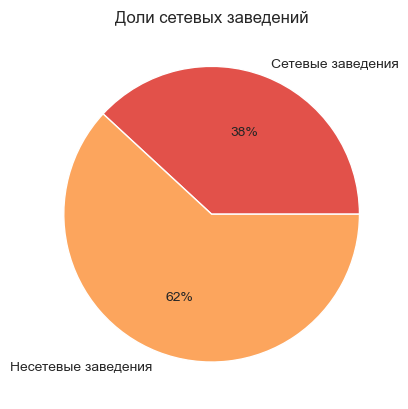

In [27]:
fig, ax = plt.subplots()
ax.pie(x=[data['chain'].mean(), 1 - data['chain'].mean()], labels=['Сетевые заведения', 'Несетевые заведения'], autopct='%1.0f%%')
plt.title('Доли сетевых заведений');

- 38% заведений, представленных в датасете - сетевые.

***Какие категории заведений чаще являются сетевыми? Исследуйте данные и ответьте на вопрос графиком.***

In [28]:
# Создание сводной таблицы по количеству заведений в разрезе сети / не сети и категорий
data_categories_chain = data.pivot_table(index = 'category', values='address', columns = 'chain', aggfunc='count').reset_index()
data_categories_chain.columns = ['категория', 'не сеть', 'сеть']
data_categories_chain['всего'] = data_categories_chain['не сеть'] + data_categories_chain['сеть']
data_categories_chain['доля сетевых'] = round(data_categories_chain['сеть'] / data_categories_chain['всего'], 2)
data_categories_chain = data_categories_chain.sort_values(by='всего')
data_categories_chain

,категория,не сеть,сеть,всего,доля сетевых
1,булочная,99,157,256,0.61
7,столовая,227,88,315,0.28
2,быстрое питание,371,232,603,0.38
5,пиццерия,303,330,633,0.52
0,"бар,паб",596,169,765,0.22
4,кофейня,693,720,1413,0.51
6,ресторан,1313,730,2043,0.36
3,кафе,1599,779,2378,0.33


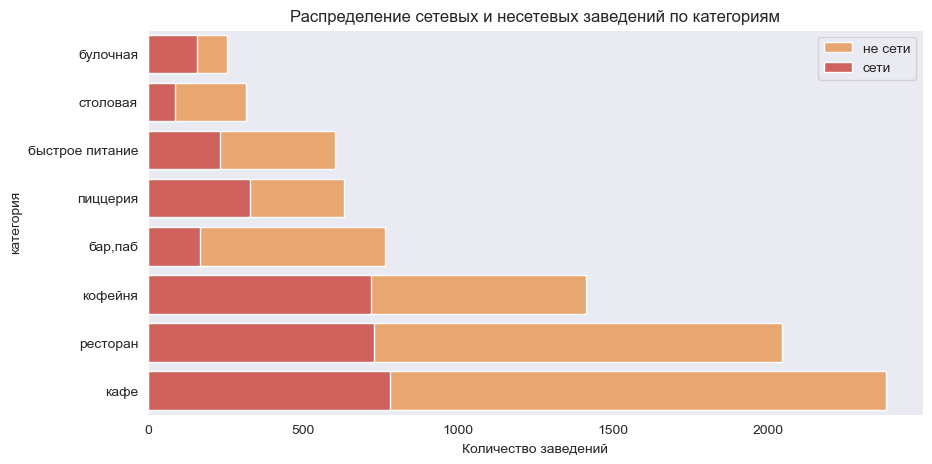

In [29]:
plt.figure(figsize=(10, 5))
bar1 = sns.barplot(x="всего",  y="категория", data=data_categories_chain, color='#fca55d', label='не сети')
bar2 = sns.barplot(x="сеть", y="категория", data=data_categories_chain, color='#e2514a', label='сети')
plt.xlabel('Количество заведений')
plt.legend()
plt.title('Распределение сетевых и несетевых заведений по категориям');

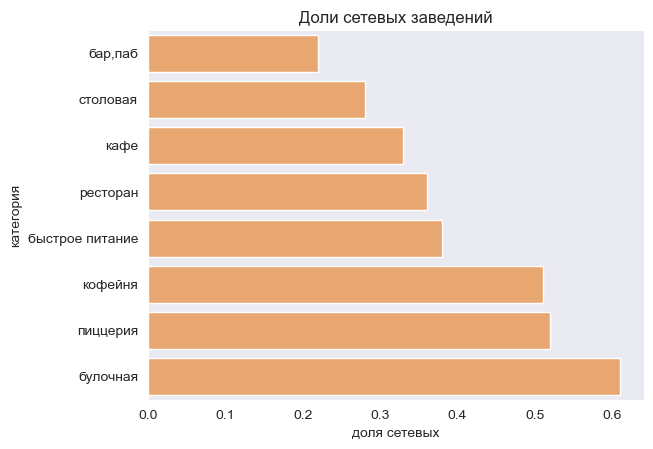

In [30]:
ax = sns.barplot(x="доля сетевых",  y="категория", data=data_categories_chain.sort_values(by='доля сетевых'), color='#fca55d')
plt.title('Доли сетевых заведений');

- Несмотря на то, что сетевых заведений среди кафе встречается чаще всего - в разрезе категории доля сетей не более трети.
- Почти половина заведений среди кофеен - сетевые.
- Большая часть всех заведений среди булочных - сети.
- Наименьшая доля сетевых заведений в категории "бар, паб".

<a id="popular"></a> 
### 3.4. Анализ популярных сетей
***Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. Постройте подходящую для такой информации визуализацию. Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся?***

In [31]:
# Создаем сводную таблицу - топ-15 популярных сетей в Москве
data_names = data.query('chain == 1').\
    pivot_table(index = 'name', values=['address', 'rating', 'category'], \
                aggfunc={'address': 'count', 'rating': 'mean', 'category': 'first'})\
                .reset_index().sort_values(by='address', ascending=False)
data_names = data_names.rename(columns={'address': 'count'})
data_names = data_names.head(15)
data_names

,name,count,category,rating
746,Шоколадница,120,кофейня,4.177500
344,Домино'с Пицца,76,пиццерия,4.169737
340,Додо Пицца,74,пиццерия,4.286486
148,One Price Coffee,71,кофейня,4.064789
759,Яндекс Лавка,69,ресторан,3.872464
59,Cofix,65,кофейня,4.075385
170,Prime,50,ресторан,4.116000
679,Хинкальная,44,быстрое питание,4.322727
378,КОФЕПОРТ,42,кофейня,4.147619
431,Кулинарная лавка братьев Караваевых,39,кафе,4.394872


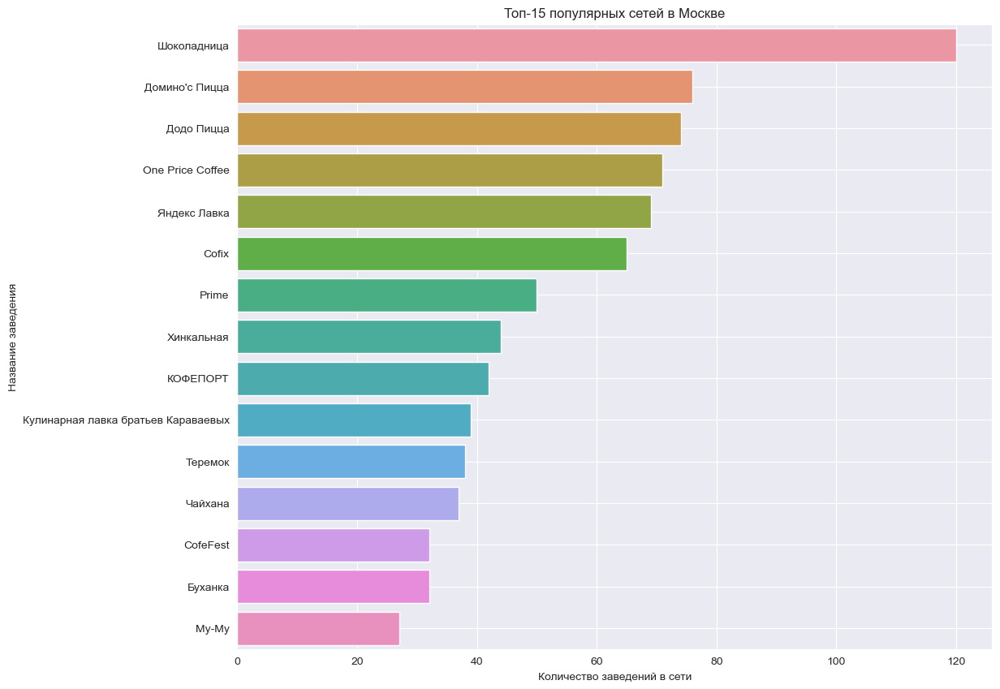

In [32]:
plt.figure(figsize=(12, 10))
ax = sns.barplot(x = 'count', y = 'name', data=data_names)
plt.title('Топ-15 популярных сетей в Москве')
plt.xlabel('Количество заведений в сети')
plt.ylabel('Название заведения')
plt.grid()

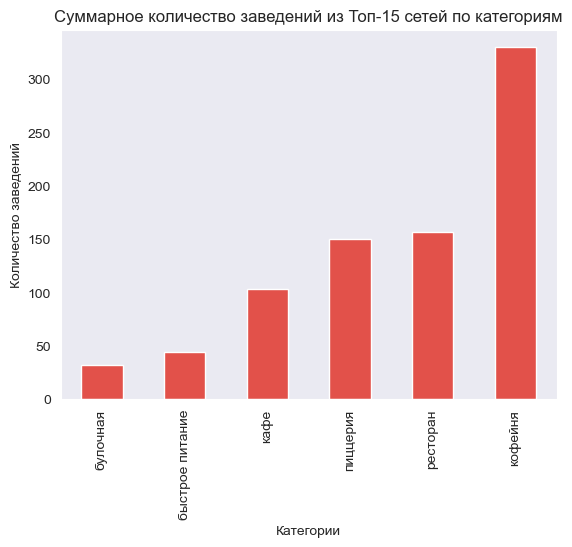

In [33]:
data_names.groupby('category')['count'].sum().sort_values().plot(kind='bar')
plt.title('Суммарное количество заведений из Топ-15 сетей по категориям')
plt.xlabel('Категории')
plt.ylabel('Количество заведений');

In [34]:
data_names.groupby('category')['count'].count().sort_values()

category
булочная           1
быстрое питание    1
пиццерия           2
кафе               3
ресторан           3
кофейня            5
Name: count, dtype: int64

- В Топ-15 одна треть - это кофейни.
- Самое большое количество заведений у сети "Шоколадница" - 120 кофеен.
- В рейтинг вошло всего 2 пиццерии "Домино'с Пицца" и "Додо Пицца", однако по количеству заведений они находятся почти на одном уровне с ресторанами.

<a id="district"></a> 
### 3.5. Анализ районов
***Какие административные районы Москвы присутствуют в датасете? Отобразите общее количество заведений и количество заведений каждой категории по районам. Попробуйте проиллюстрировать эту информацию одним графиком.***

In [35]:
data_districts = data.pivot_table(index = 'district', columns='category', values='address', aggfunc='count', margins=True)
data_districts

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,All
district,,,,,,,,,
Восточный административный округ,53,25,71,272,105,72,160,40,798
Западный административный округ,50,37,62,239,150,71,218,24,851
Северный административный округ,68,39,58,235,193,77,189,41,900
Северо-Восточный административный округ,63,28,82,269,159,68,182,40,891
Северо-Западный административный округ,23,12,30,115,62,40,109,18,409
Центральный административный округ,364,50,87,464,428,113,670,66,2242
Юго-Восточный административный округ,38,13,67,282,89,55,145,25,714
Юго-Западный административный округ,38,27,61,238,96,64,168,17,709
Южный административный округ,68,25,85,264,131,73,202,44,892


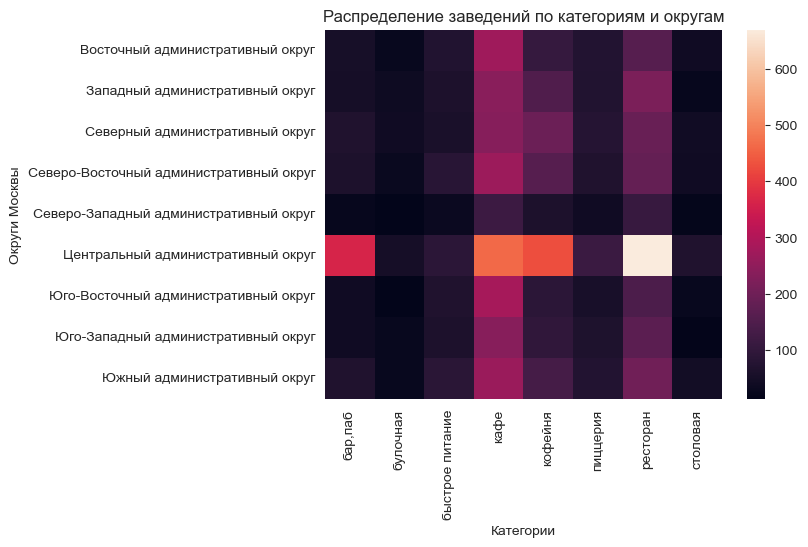

In [36]:
sns.heatmap(data.pivot_table(index = 'district', columns='category', values='address', aggfunc='count'))
plt.title('Распределение заведений по категориям и округам')
plt.xlabel('Категории')
plt.ylabel('Округи Москвы');

- Всего представлено 9 административных районов Москвы.
- Самое большое число заведений в Центральном административном округе (2 242 заведения).
- Меньше всего заведений в Северо-Западном административном округе (409 объектов).
- В остальных районах общее количество заведений держится на уровне 700 - 900 объектов.
- В Центральном административном округе преобладают рестораны. В остальных районах более популярны кафе.

<a id="rating"></a> 
### 3.6. Анализ рейтингов
***Визуализируйте распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?***

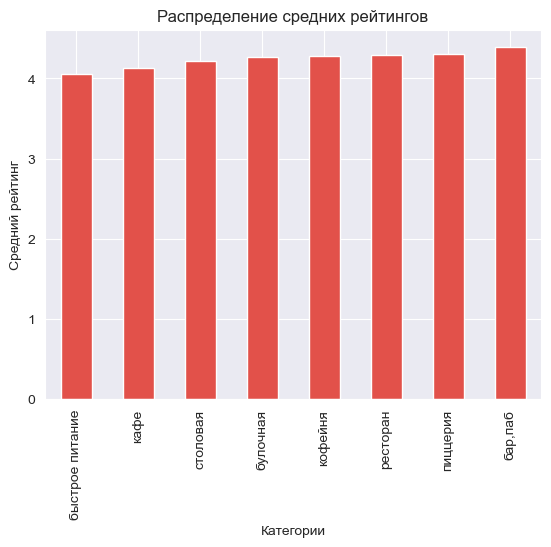

In [37]:
data.groupby('category')['rating'].mean().sort_values().plot(kind='bar', grid=True, title='Распределение средних рейтингов')
plt.xlabel('Категории')
plt.ylabel('Средний рейтинг');

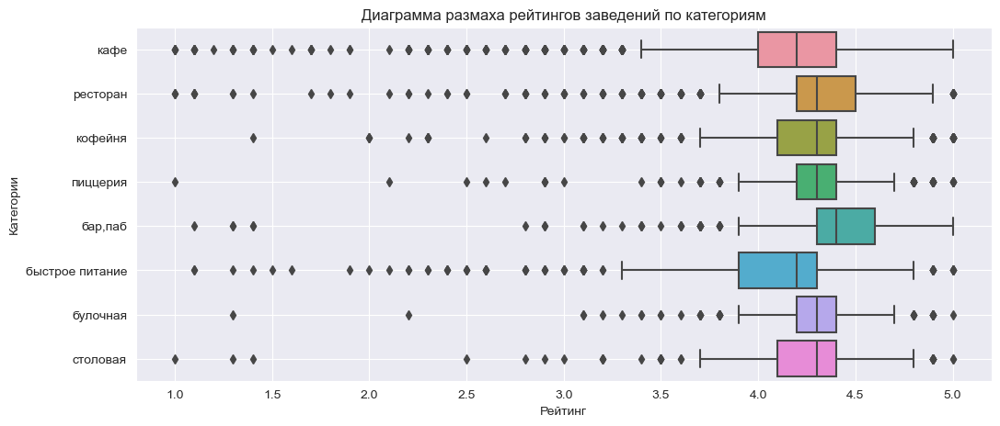

In [38]:
plt.figure(figsize=(12, 5))
sns.boxplot(x='rating', y='category', data=data)
plt.title('Диаграмма размаха рейтингов заведений по категориям')
plt.grid()
plt.xlabel('Рейтинг')
plt.ylabel('Категории');

- Самый высокий средний рейтинг у категории "бар, паб".
- Самый низкий средний рейтинг у заведений быстрого питания.

<a id="choropleth"></a> 
### 3.7. Построение хороплета
***Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района.***

In [39]:
rating_df = data.groupby('district', as_index=False)['rating'].agg('mean')
rating_df.sort_values(by='rating', ascending=False)

,district,rating
5,Центральный административный округ,4.377520
2,Северный административный округ,4.239778
4,Северо-Западный административный округ,4.208802
8,Южный административный округ,4.184417
1,Западный административный округ,4.181551
0,Восточный административный округ,4.174185
7,Юго-Западный административный округ,4.172920
3,Северо-Восточный административный округ,4.148260
6,Юго-Восточный административный округ,4.101120


In [40]:
with open('admin_level_geomap.geojson', 'r', encoding='utf-8') as f:
        state_geo = json.load(f)
    
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

In [41]:
# Функция по созданию хороплета
def make_map(data, columns, title):
    
    # создаём карту Москвы
    m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

    # создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
    Choropleth(
        geo_data=state_geo,
        data=data,
        columns=columns,
        key_on='feature.name',
        fill_color='YlGn',
        fill_opacity=0.8,
        legend_name=title,
    ).add_to(m)

    # выводим карту
    return m

In [42]:
make_map(rating_df, ['district', 'rating'], 'Средний рейтинг заведений по районам')

- Самый высокий средний рейтинг у заведений в Центральном округе.
- Самый низкий средний рейтинг в Юго-Восточном округе.

<a id="all"></a> 
### 3.8. Отображение всех заведений на карте
***Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки folium.***

In [43]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)
    
# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

m

<a id="street"></a> 
### 3.9. Анализ улиц
***Найдите топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам. Попробуйте проиллюстрировать эту информацию одним графиком.***

In [44]:
data_streets_list = data.groupby('street')['name'].count().sort_values(ascending=False).head(15)
data_streets_list

street
проспект Мира             184
Профсоюзная улица         122
проспект Вернадского      108
Ленинский проспект        107
Ленинградский проспект     95
Дмитровское шоссе          88
Каширское шоссе            77
Варшавское шоссе           76
Ленинградское шоссе        70
МКАД                       65
Люблинская улица           60
улица Вавилова             55
Кутузовский проспект       54
улица Миклухо-Маклая       49
Пятницкая улица            48
Name: name, dtype: int64

In [45]:
data_streets = data.\
                    query('street in @data_streets_list.index')\
                    .pivot_table(index = 'street', columns='category', values='name', aggfunc='count')
data_streets = data_streets.fillna(0)
data_streets

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
street,,,,,,,,
Варшавское шоссе,6.0,0.0,7.0,18.0,14.0,4.0,20.0,7.0
Дмитровское шоссе,6.0,2.0,10.0,23.0,11.0,8.0,24.0,4.0
Каширское шоссе,2.0,0.0,10.0,20.0,16.0,5.0,19.0,5.0
Кутузовский проспект,2.0,1.0,2.0,14.0,13.0,3.0,16.0,3.0
Ленинградский проспект,15.0,4.0,2.0,12.0,25.0,9.0,25.0,3.0
Ленинградское шоссе,5.0,2.0,5.0,13.0,13.0,3.0,26.0,3.0
Ленинский проспект,10.0,3.0,2.0,26.0,23.0,5.0,33.0,5.0
Люблинская улица,5.0,0.0,5.0,26.0,11.0,1.0,10.0,2.0
МКАД,1.0,0.0,9.0,45.0,4.0,0.0,5.0,1.0


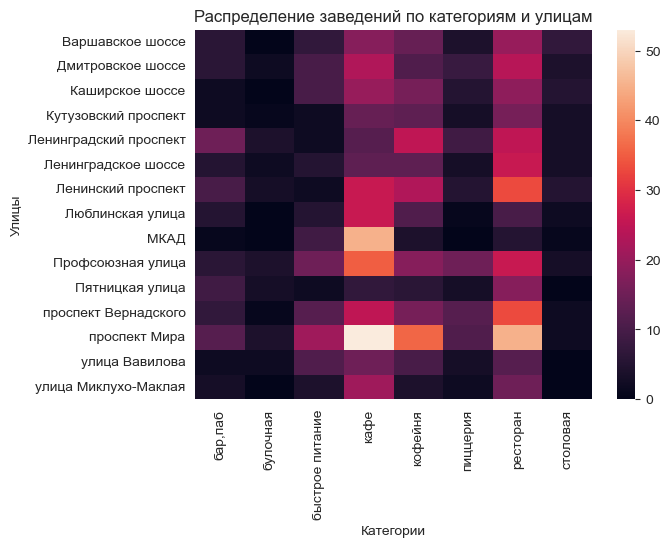

In [46]:
sns.heatmap(data_streets)
plt.title('Распределение заведений по категориям и улицам')
plt.xlabel('Категории')
plt.ylabel('Улицы');

- Больше всего заведений находится на улице Мира.
- Большая часть заведений - кафе и рестораны. Также значительная часть - кофейни.
- Также множество заведений общественного питания находятся на Профсоюзной улице, проспекте Вернадского и Ленинском проспекте. 
- В топ-15 улицах мало столовых и булочных.

***Найдите улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?***

In [47]:
data_streets_list_one = data.groupby('street')['name'].count()
data_streets_list_one = data_streets_list_one[data_streets_list_one == 1]
len(data_streets_list_one)

458

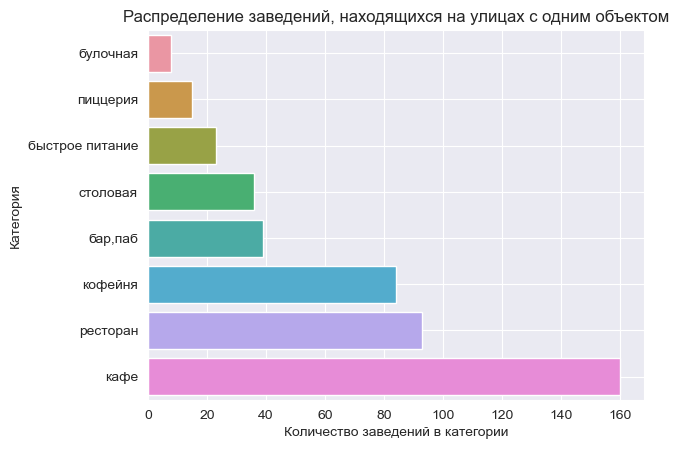

In [48]:
# Строим сводную таблицу по улицам с одним заведением в разрезе категорий
data_streets_one = data.\
                    query('street in @data_streets_list_one.index')\
                    .pivot_table(index = 'street', columns='category', values='name', aggfunc='count', margins=True)

data_streets_one = data_streets_one.T
data_streets_one = data_streets_one.drop('All')
data_streets_one = data_streets_one.sort_values(by='All')

ax = sns.barplot(x = 'All', y = data_streets_one.index, data=data_streets_one)
plt.title('Распределение заведений, находящихся на улицах с одним объектом')
plt.xlabel('Количество заведений в категории')
plt.ylabel('Категория')
plt.grid()

- Всего 458 улиц с одним заведением общественного питания.
- Больше всего заведений, находящихся на улице с одним объектом общепита - кафе. На втором месте - рестораны, на третьем - кофейни.
- Булочные и пиццерии чаще всего соседствуют на улице с другими заведениями.

<a id="bill"></a> 
### 3.10. Анализ средних чеков
***Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитайте медиану этого столбца для каждого района. Используйте это значение в качестве ценового индикатора района. Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируйте цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?***

In [49]:
data_bill = data.groupby('district', as_index=False)['middle_avg_bill'].median()
data_bill

,district,middle_avg_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [50]:
make_map(data_bill, ['district', 'middle_avg_bill'], 'Средний чек заведений по районам')

- Самый высокий средний чек (1 000 руб.) в Центральном и Западном округах. 
- При отдалении от центра средний чек снижается. Однако, можно заметить, более явное снижение среднего чека в южном и юго-восточном округах.

<a id="other"></a> 
### 3.11. Анализ взаимосвязей
***Необязательное задание: проиллюстрируйте другие взаимосвязи, которые вы нашли в данных. Например, по желанию исследуйте часы работы заведений и их зависимость от расположения и категории заведения. Также можно исследовать особенности заведений с плохими рейтингами, средние чеки в таких местах и распределение по категориям заведений.***

#### 3.11.1 Анализ круглосуточных заведений по районам и категориям

In [51]:
data_24 = data.groupby('district', as_index=False)['is_24/7'].sum()
data_24.sort_values(by='is_24/7', ascending=False)

,district,is_24/7
5,Центральный административный округ,131
0,Восточный административный округ,97
6,Юго-Восточный административный округ,93
3,Северо-Восточный административный округ,75
8,Южный административный округ,75
7,Юго-Западный административный округ,73
1,Западный административный округ,72
2,Северный административный округ,71
4,Северо-Западный административный округ,43


In [52]:
make_map(data_24, ['district', 'is_24/7'], 'Количество круглосуточных заведений по районам')

- Основная масса круглосуточных заведений находятся в центре Москвы. Также много таких заведений в восточчных округах.
- В северо-западном направлении находится меньшая часть круглосуточных заведений.

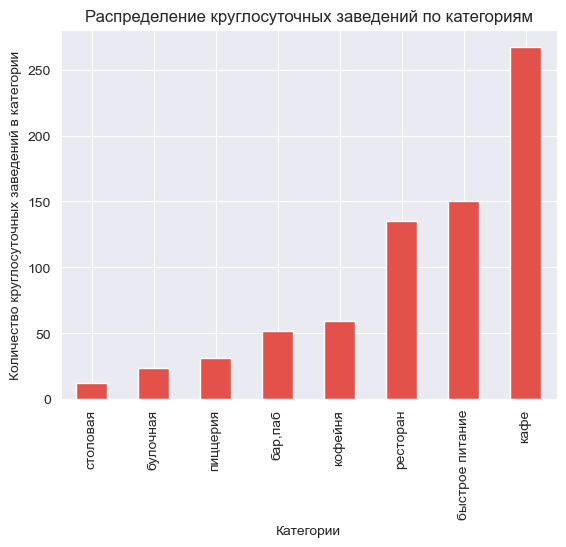

In [53]:
data.groupby('category')['is_24/7'].sum().sort_values().plot(kind='bar')
plt.grid()
plt.title('Распределение круглосуточных заведений по категориям')
plt.xlabel('Категории')
plt.ylabel('Количество круглосуточных заведений в категории');

- Наибольшая доля круглосуточных заведений - кафе. На втором и третьем местах - заведения быстрого питания и рестораны соответственно.

#### 3.11.2 Анализ заведений с плохим рейтингом

In [54]:
data_bad = data.query('rating < 3')
print('Количество заведений с рейтингом менее "3":', len(data_bad))

Количество заведений с рейтингом менее "3": 210


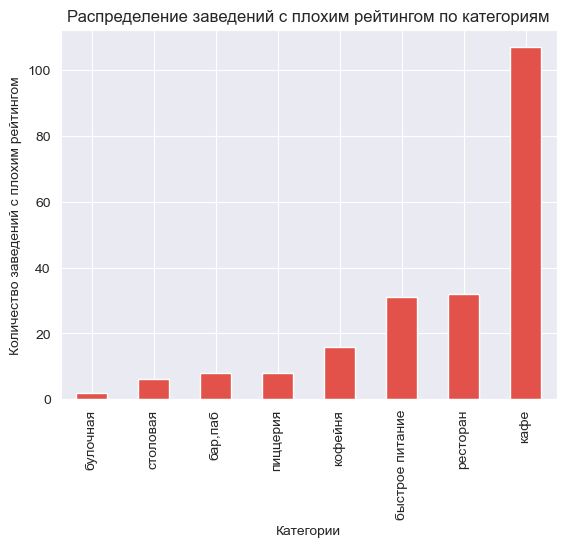

In [55]:
data_bad\
    .groupby('category')['name'].count()\
    .sort_values()\
    .plot(kind='bar', title='Распределение заведений с плохим рейтингом по категориям', grid=True)
plt.xlabel('Категории')
plt.ylabel('Количество заведений с плохим рейтингом');

In [56]:
# Сравнительная таблица средних чеков у всех заведений и заведений с низким рецтингом
data_median_bill = pd.pivot_table(data=data, index='category', values=['middle_avg_bill'], aggfunc='median')
data_bad_median_bill = pd.pivot_table(data=data_bad, index='category', values=['middle_avg_bill'], aggfunc='median')
data_bad_median_bill.columns = ['bad_rating_bill']
data_bill_compare = data_bad_median_bill.join(data_median_bill, how='left')
data_bill_compare

,bad_rating_bill,middle_avg_bill
category,,
булочная,325.0,450.0
быстрое питание,325.0,375.0
кафе,750.0,550.0
пиццерия,950.0,600.0
столовая,237.5,300.0


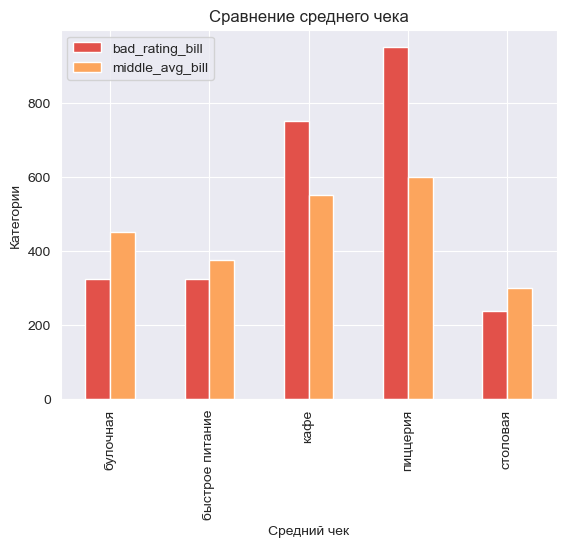

In [57]:
ax = data_bill_compare.plot.bar(rot=0)
plt.grid()
plt.title('Сравнение среднего чека')
plt.xticks(rotation=90)
plt.xlabel('Средний чек')
plt.ylabel('Категории');

- При сравнении среднего чека в заведениях с низким рейтингом со средним чеком по категориям выявлена следующая особенность: в заведениях, где средний чек и так невысокий - в заведениях с низким рейтингом средний чек еще больше снижается, например, это касается булочных, столовых и объектов быстрого питания. Но в заведениях с более высоким средним чеком такая особенность не наблюдается.
- Существенное различие в среднем чеке у пиццерий. Возможно, низкий рейтинг из-за несоответствия цены и качества. 

<a id="result_analysis"></a> 
### 3.12. Вывод (анализ данных)

- Из 8 представленных в датасете категорий наибольшая доля у заведений категории "кафе" - 28%, на втором месте - "рестораны" - 24%. 17% составляют кофейни. Меньше всего представлено столовых и булочных (4% и 3% соответственно).
- Разброс по количеству посадочных мест достаточно большой, но средние значения - 50 - 80 мест. Наибольшее количество посадочных мест у ресторанов, затем идут бары и кофейни. В среднем в данных заведениях 80 и более мест. Меньше всего мест в булочных и пиццериях (в среднем 50 - 55 мест).
- 38% заведений, представленных в датасете - сетевые. Если рассматривать доли сетевых заведений по категориям, то можно сделать вывод, что большая часть булочных и почти половина кофеен - это сетевые заведения. Несмотря на то, что сетевых заведений среди кафе встречается чаще всего - в разрезе категории доля сетей не более трети. Наименьшая доля сетевых заведений в категории "бар, паб".
- Самые многочисленные сети: кофейни "Шоколадница" и пиццерии "Домино'с Пицца" и "Додо Пицца". В Топ-15 сетей одна треть - это кофейни.
- Всего представлено 9 административных районов Москвы. Самое большое число заведений в Центральном округе (более 2,2 тысяч). Меньше всего заведений в Северо-Западном административном округе (409 объектов). В остальных районах общее количество заведений держится на уровне 700 - 900 объектов.
- В Центральном административном округе преобладают рестораны. В остальных районах более популярны кафе.
- Самый высокий средний рейтинг у категории "бар, паб". Самый низкий средний рейтинг у заведений быстрого питания. Что касается округов, то самый высокий средний рейтинг у заведений в Центральном округе, а самый низкий - в Юго-Восточном округе.
- Больше всего заведений находится на улице Мира. Также популярны улицы: Профсоюзная улица, проспект Вернадского и Ленинский проспект. Большая часть заведений на этих улицах - кафе и рестораны и значительная часть - кофейни.
- Всего в датасете 458 улиц с одним заведением общественного питания, на которых чаще всего наблюдается кафе. На втором месте - рестораны, на третьем - кофейни. Булочные и пиццерии чаще всего соседствуют на улице с другими заведениями.
- Самый высокий средний чек в Центральном и Западном округах. При отдалении от центра средний чек снижается. Однако, можно заметить более явное снижение среднего чека в южном и юго-восточном округах.
- Основная масса круглосуточных заведений находятся в центре Москвы. Также много таких заведений в восточных округах. Наибольшая доля круглосуточных заведений - кафе. На втором и третьем местах - заведения быстрого питания и рестораны соответственно.
- При сравнении среднего чека в заведениях с низким рейтингом со средним чеком по категориям выявлено, что в заведениях, где средний чек и так невысокий (булочных, столовых и объектов быстрого питания) - в заведениях с низким рейтингом средний чек еще больше снижается. Но в заведениях с более высоким средним чеком такая особенность не наблюдается. Так, например, существенное различие в среднем чеке у пиццерий. Возможно, снижение рейтинга за неоправданно высокие цены для посетителя.

<a id="cafe"></a> 
## 4. Исследование: открытие кофейни

<a id="cafe_place"></a> 
### 4.1. Особенности расположения кофеен
***Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?***

In [58]:
coffee = data.query('category == "кофейня"')
print('Количество кофеен:', len(coffee))
print('Количество сетевых кофеен:', len(coffee.query('chain == 1')))

Количество кофеен: 1413
Количество сетевых кофеен: 720


In [59]:
coffee_district = coffee.groupby('district', as_index=False)['name'].count()

make_map(coffee_district, ['district', 'name'], 'Количество кофеен по районам')

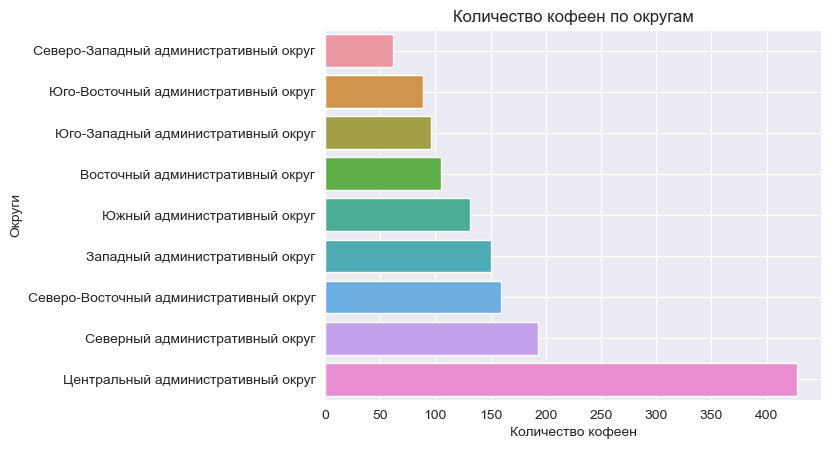

In [60]:
coffee_district = coffee.groupby('district')['name'].count().sort_values()
ax = sns.barplot(x = coffee_district, y = coffee_district.index)
plt.title('Количество кофеен по округам')
plt.xlabel('Количество кофеен')
plt.ylabel('Округи')
plt.grid()

- Всего в датасете 1 413 кофеен, из них сетевых - 720.
- Больше всего кофеен расположено в Центральном округе, затем идет Северный округ.
- Меньше всего кофеен в Северо-Западном, Юго-Западном, Юго-Восточном и Восточном округах.

<a id="cafe_24"></a> 
### 4.2. Анализ круглосуточных кофеен
***Есть ли круглосуточные кофейни?***

In [61]:
print('Всего круглосуточных кофеен:', coffee['is_24/7'].sum())

Всего круглосуточных кофеен: 59


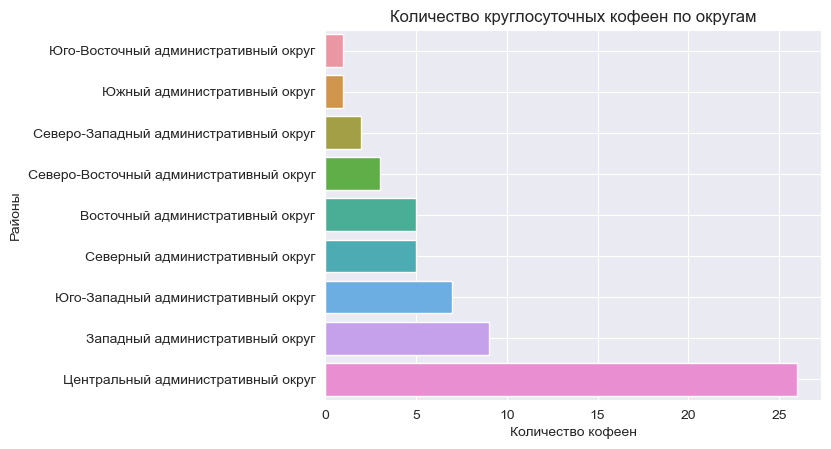

In [62]:
coffee_24 = coffee.groupby('district')['is_24/7'].sum().sort_values()
ax = sns.barplot(x = coffee_24, y = coffee_24.index)
plt.title('Количество круглосуточных кофеен по округам')
plt.xlabel('Количество кофеен')
plt.ylabel('Районы')
plt.grid()

- Всего 59 круглосуточных кофеен, почти половина из них находится в Центральном округе.
- В большей части округов 5 или менее круглосуточных кофеен.

<a id="cafe_rating"></a> 
### 4.3. Анализ рейтингов кофеен
***Какие у кофеен рейтинги? Как они распределяются по районам?***

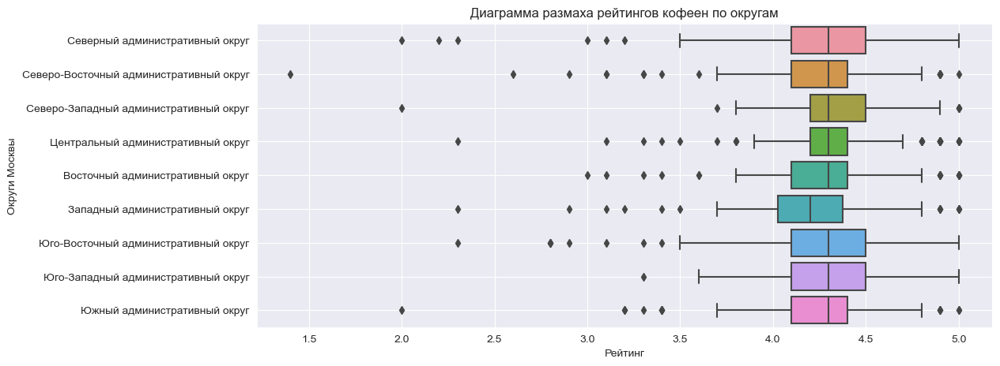

In [63]:
plt.figure(figsize=(12, 5))
sns.boxplot(x='rating', y='district', data=coffee)
plt.title('Диаграмма размаха рейтингов кофеен по округам')
plt.grid()
plt.xlabel('Рейтинг')
plt.ylabel('Округи Москвы');

- Средний рейтинг не сильно варьируется от округов - находится примерно на уровне 4.2 - 4.3.
- Самый низкий средний рейтинг в Западного административном округе.

<a id="cafe_price"></a> 
### 4.4. Анализ среднего чека кофеен
***На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?***

In [64]:
coffee_bill = coffee.groupby('district', as_index=False)['middle_coffee_cup'].median()
make_map(coffee_bill, ['district', 'middle_coffee_cup'], 'Цена одной чашки капучино')

- Самая дорогая стоимость чашки капучино в Центральном, Юго-Западном и Западном районах (около 190 рублей).
- Самая низкая стоимость в Восточном округе (135 руб.).

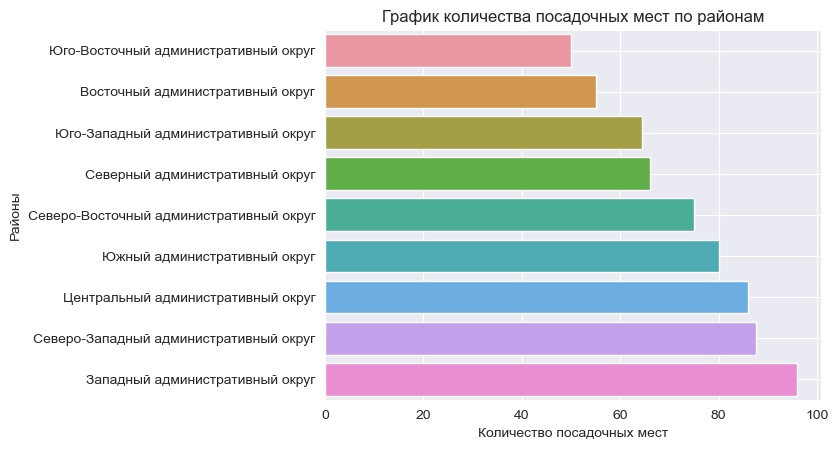

In [65]:
coffee_seats = coffee.groupby('district')['seats'].median().sort_values()
ax = sns.barplot(x = coffee_seats, y = coffee_seats.index)
plt.title('График количества посадочных мест по районам')
plt.xlabel('Количество посадочных мест')
plt.ylabel('Районы')
plt.grid()

- Самые большие кофейни находятся в Западном, Северо-Западном и Центральном округах.

**Зависимость цены и рейтинга**

In [66]:
coffee['rating'].corr(coffee['middle_coffee_cup'])

0.09610195824565272

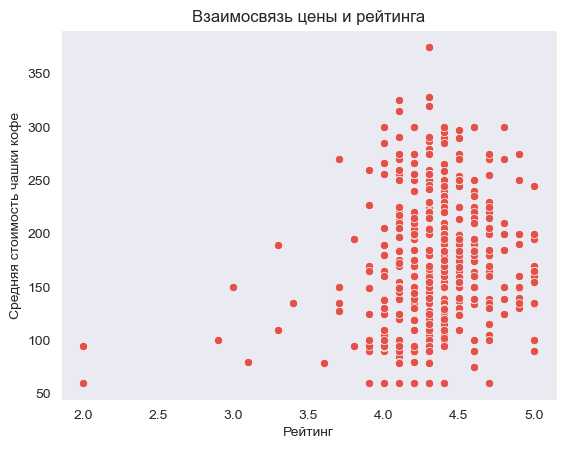

In [67]:
sns.scatterplot(data=coffee.query('middle_coffee_cup < 1000'), x='rating', y='middle_coffee_cup')
plt.title('Взаимосвязь цены и рейтинга')
plt.xlabel('Рейтинг')
plt.ylabel('Средняя стоимость чашки кофе');

- Нет четкой зависимости между ценой чашки кофе и рейтингом кофейни.

**Анализ кофеен в Юго-Западном округе**

По количеству кофеен малочисленными являются округа: Северо-Западный, Юго-Западный, Юго-Восточный и Восточный. Первые три округа также немногочисленны и по общему количеству заведений.

Самая дорогая средняя цена чашки капучино в Юго-Западном округе, что позволит конкурировать с уже имеющимися кофейнями.

Проведем более детальный анализ кофеен в Юго-Западном округе.

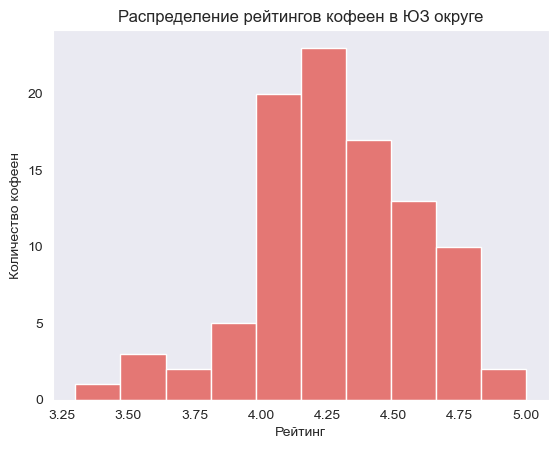

In [68]:
coffee_open = coffee.query('district == "Юго-Западный административный округ"')
sns.histplot(coffee_open['rating'])
plt.title('Распределение рейтингов кофеен в ЮЗ округе')
plt.xlabel('Рейтинг')
plt.ylabel('Количество кофеен');

In [69]:
coffee_open['rating'].describe()

count    96.000000
mean      4.283333
std       0.304930
min       3.300000
25%       4.100000
50%       4.300000
75%       4.500000
max       5.000000
Name: rating, dtype: float64

Большинство кофеен имеет неплохой рейтинг - более 4х. Средний рейтинг кофеен - 4.3. Однако, не более 25% имеют рейтинг более 4.5. Следовательно, если новая кофейня будет иметь интересную концепцию и делать качественный кофе - это существенно повысит шансы на успех.

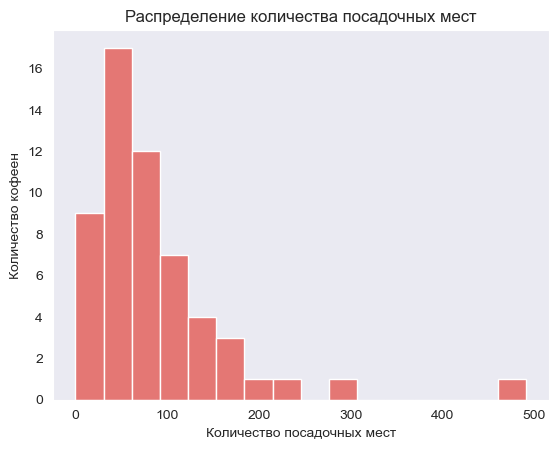

In [70]:
sns.histplot(coffee_open['seats'])
plt.title('Распределение количества посадочных мест')
plt.ylabel('Количество кофеен')
plt.xlabel('Количество посадочных мест');

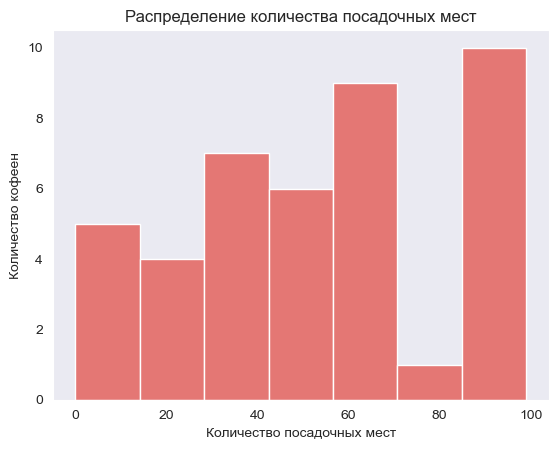

In [71]:
sns.histplot(coffee_open.query('seats < 100')['seats'], bins=7)
plt.title('Распределение количества посадочных мест')
plt.ylabel('Количество кофеен')
plt.xlabel('Количество посадочных мест');

Разброс количества посадочных мест большой - есть кофейни до 25 мест, есть и более 200.
Если у нас нет цели открыть кофейню в университете или бизнес-центре, то не стоит открывать ее с большим количеством посадочных мест. Стоит ограничиться на 40-60 мест.

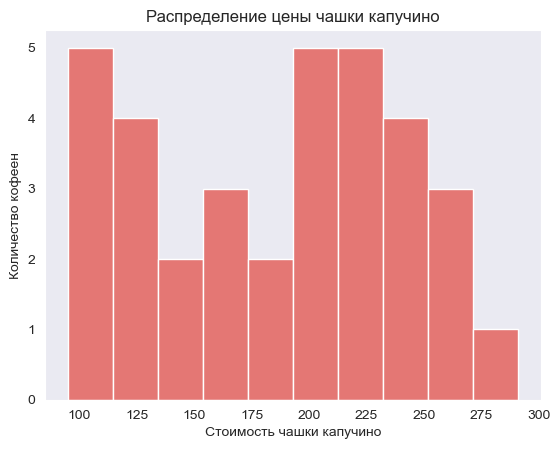

In [72]:
sns.histplot(coffee_open['middle_coffee_cup'], bins=10)
plt.title('Распределение цены чашки капучино')
plt.ylabel('Количество кофеен')
plt.xlabel('Стоимость чашки капучино');

In [73]:
coffee_open['middle_coffee_cup'].describe()

count     34.000000
mean     184.176471
std       57.536007
min       95.000000
25%      129.000000
50%      198.000000
75%      229.250000
max      291.000000
Name: middle_coffee_cup, dtype: float64

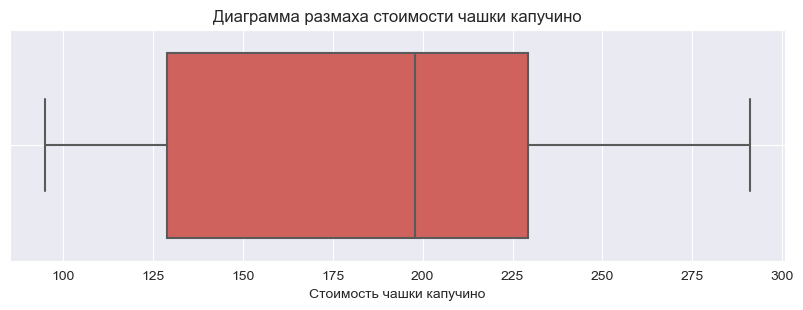

In [74]:
plt.figure(figsize=(10, 3))
sns.boxplot(x='middle_coffee_cup', data=coffee_open)
plt.title('Диаграмма размаха стоимости чашки капучино')
plt.grid()
plt.xlabel('Стоимость чашки капучино');

Если кофейня будет ориентироваться на массового потребителя то, чтобы оставаться конкурентоспособным цена чашки кофе не должна превышать 200 рублей. В противном случае, нужно будет удерживать потребителя дополнительными бонусами, подарками или оригинальной идеей.

<a id="result_cafe"></a> 
### 4.5. Вывод (Исследование: открытие кофейни)

- В данных всего 1 413 кофеен, из низ сетевых - 720.
- Больше всего кофеен расположено в Центральном округе, затем идет Северный округ. Меньше всего кофеен в Северо-Западном, Юго-Западном, Юго-Восточном и Восточном округах.
- Всего 59 круглосуточных кофеен, почти половина из них находится в Центральном округе.
- В большей части округов 5 или менее круглосуточных кофеен.
- Средний рейтинг не сильно варьируется от округов - находится примерно на уровне 4.2 - 4.3.
- Самая дорогая стоимость чашки капучино в Центральном, Юго-Западном и Западном районах. Самая низкая стоимость в Восточном округе.
- Самые большие кофейни находятся в Западном, Северо-Западном и Центральном округах.
- Нет четкой зависимости между ценой чашки кофе и рейтингом кофейни.

***Рекомендации:***
- Как видно из данных - круглосуточные кофейни не пользуются большой популярностью. Нет необходимости открывать круглосуточную кофейню даже в центре в многолюдных местах с туристами, так как ночью вероятнее всего они предпочтут кафе, ресторан или бар. Исключение можно сделать для таких мест как аэропорты или вокзалы, где люди хотят скоротать немного времени.
- Было выявлено, что меньше всего заведений, в том числе и кофеен в округах: Северо-Западном, Юго-Западном и Юго-Восточном. Среди этих округов в Юго-Восточном округе - самый низкий средний чек, соответственно, там будет сложнее конкурировать с другими кофейнями. Самая дорогая средняя цена чашки капучино в Юго-Западном округе. Следовательно, более перспективным направлением было бы открыть кофейню в Юго-Западном округе. Кроме того, по данным статистики на 2021 год население данного округа составляет 10.93 % населения Москвы и является четвёртым по населению округом, что говорит о преимуществах данного округа по привлечению потенциальной аудитории.
- Посадочные места стоит огранить количеством 40-60.
- Если кофейня будет ориентироваться на массового потребителя то, чтобы оставаться конкурентоспособной, цена чашки кофе не должна превышать 200 рублей. В противном случае, нужно будет удерживать потребителя дополнительными бонусами, подарками или оригинальной идеей.
- В целом по Юго-Западному округу видно, что не так много заведений с рейтингом более 4.5, соответственно, если концепция новой кофейни и качество предлагаемого продукта заинтересует потенциального потребителя, то кофейня будет достаточно конкурентоспособной.

<a id="presentation"></a> 
## 5. Презентация


Презентация: https://github.com/tsepulya/da-portfolio/blob/main/analysis_moscow_food_sphere/analysis-coffee-moscow.pdf